In [3]:
%%capture
!pip install -Uqq fastai

Introduction to Image Augmentation

One problem often faced in deep learning is the scarcity of training data. Labeling data is time-consuming and expensive, so it's best to make the most of the data we have. What if there were were a way to multiply the size of our training dataset?

Image augmentation changes images slightly so that one image can serve as many training examples. The image below shows how a single image can be transformed using one of six different transformations.



[1]

Besides creating "more" data, image augmentation can also help fight overfitting. One thing that can happen in deep learning is that the images we use in our training dataset often don't match the conditions in the real world. Objects in the natural world occur at different scales, different orientations, and different lighting conditions. For example, a dataset for fruit classification may only contain red apples in the training set. Do we expect it to correctly classify a green apple in validation or test data? What an upside-down apple? Image augmentation can help address these issues.

In this module, we'll get some hands-on practice with a few ways to implement image augmentation using albumentations, torchvision, and fastai. Finally, we'll perform a quick experiment by training an image classifier without and with image augmentation to see whether it actually helps.

For further reading on how image augmentation can help overfitting, please read this blog post [2].

Setup & Data Download

In this lesson, we'll create some functions and load data we'll use for the rest of the module. In this module, we'll work with FastAI's PETS dataset again.

In [4]:
from fastai.vision.all import *
from fastai import *
from fastai.callback.tensorboard import TensorBoardCallback
import albumentations as alb
import torch
from torch import nn
import matplotlib.pyplot as plt
from torchvision import transforms as T
import warnings

warnings.filterwarnings('ignore')

In [5]:
plt.rcParams['figure.figsize'] = (10,10)

def remove_ticks(ax):
    ax.set_xticklabels([])
    ax.set_xticks([])
    ax.set_yticklabels([])
    ax.set_yticks([])
    for s in ['top','bottom','left','right']:
        ax.spines[s].set_visible(False)

In [6]:
path = untar_data(URLs.PETS)

In [7]:
def label_func(name):
    return '_'.join(name.split('_')[:-1])

In [8]:
files = get_image_files(path/'images')      #las 5 primeras filas
list(files[:5])

[Path('/root/.fastai/data/oxford-iiit-pet/images/american_bulldog_181.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/Maine_Coon_253.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/great_pyrenees_154.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/saint_bernard_65.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/american_bulldog_129.jpg')]

Image augmentation with albumentations

The albumentations library provides tons of different image transforms you can use. In general, you create a list of transforms you want to use, then pass that list to the Compose class, which turns all of your transforms into a pipeline.

Let's take a look at an example. In the code below, we're resizing the image, then randomly changing the brightness, contrast, scale, and rotation.

In [9]:
tfms = alb.Compose([
    alb.Resize(224, 224),
    alb.RandomBrightness(.5),
    alb.RandomContrast(.5),
    alb.RandomScale(.5),
    alb.Rotate(45),
])

Now that we have our tfms, let's see how they work in action. Let's open a sample image from our files object and visualize it.

american_bulldog


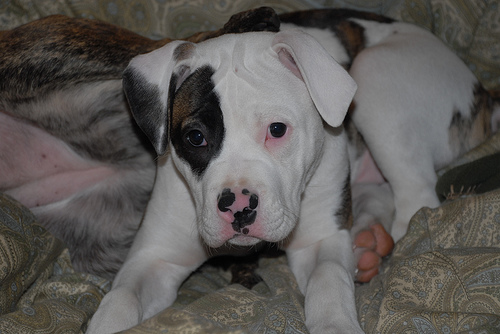

In [10]:
img_path = files[0]
img_label = label_func(img_path.name)
img = load_image(img_path)
print(img_label)
img

Next, let's call tfms on this image multiple times to see a variety of transformed images. See the code annotations below for details.

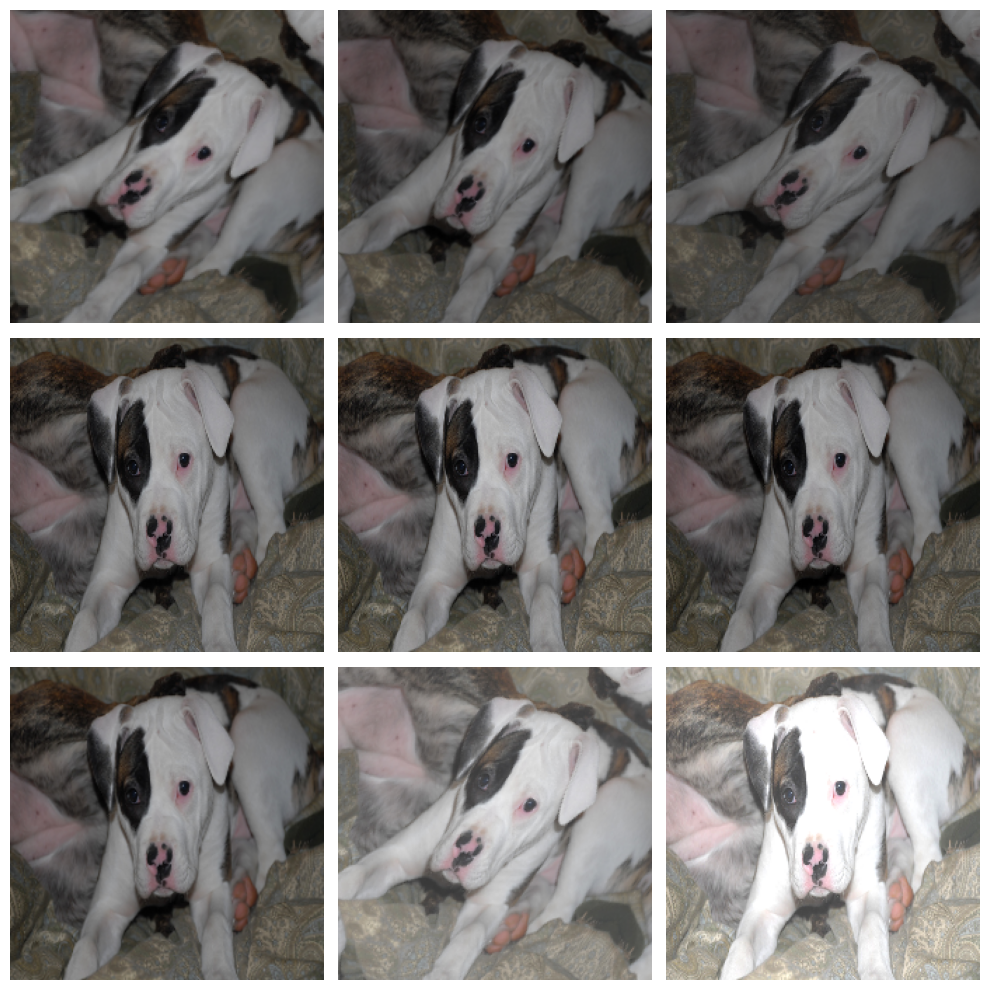

In [11]:
fig = plt.figure()
# We want 9 samples. For each sample...
for i in range(9):
    # Add an axes
    ax = fig.add_subplot(3, 3, 1+i)
    # get the transformed image using tfms
    transformed = tfms(image=np.array(img))
    # turn the transformed image back into a PIL.Image and show it
    ax.imshow(Image.fromarray(transformed['image']))
    # Get rid of ticks and tick labels
    remove_ticks(ax)
fig.tight_layout()

# Exercise 13.1

Please explore the full list of transforms in the [`albumentations` documentation](https://albumentations.ai/docs/getting_started/transforms_and_targets/).
Try adding or replacing at least 3 transforms in the `tfms` object and re-run the code to familiarize yourself with what they do.

In [12]:
# No code required here.
# Please modify the code above.

Image augmentation with torchvision

In the previous lesson, we saw how albumentations can help us perform image augmentation. Alternately, torchvision.transforms has its own library with a similar API to albumenttations. In this lesson, we'll go through an example of some transforms using torchvision.transforms.

The code block below shows an example list of transforms. If we were training a model with these transforms, we'd probably want to un-coment the T.ToTensor() transform, since this turns the passed object from an image to a tensor. However, in this lesson we're just visualizing image augmentation so there's no need to cast them to tensors.

In [13]:
ttfms = T.Compose([
    T.ToTensor(), #Convert from image to tensor
    T.Resize((224, 224)),
    T.RandomRotation(45, ),
    T.RandomPerspective(distortion_scale=.1),
    T.ColorJitter(brightness=.2, contrast=.2, saturation=.2, hue=.1),
    T.ToPILImage() # At the end of the pipeline, convert the tensor back to an image
])

Now that we have our ttfms, let's see how they work in action. Let's open a sample image from our files object and visualize it.

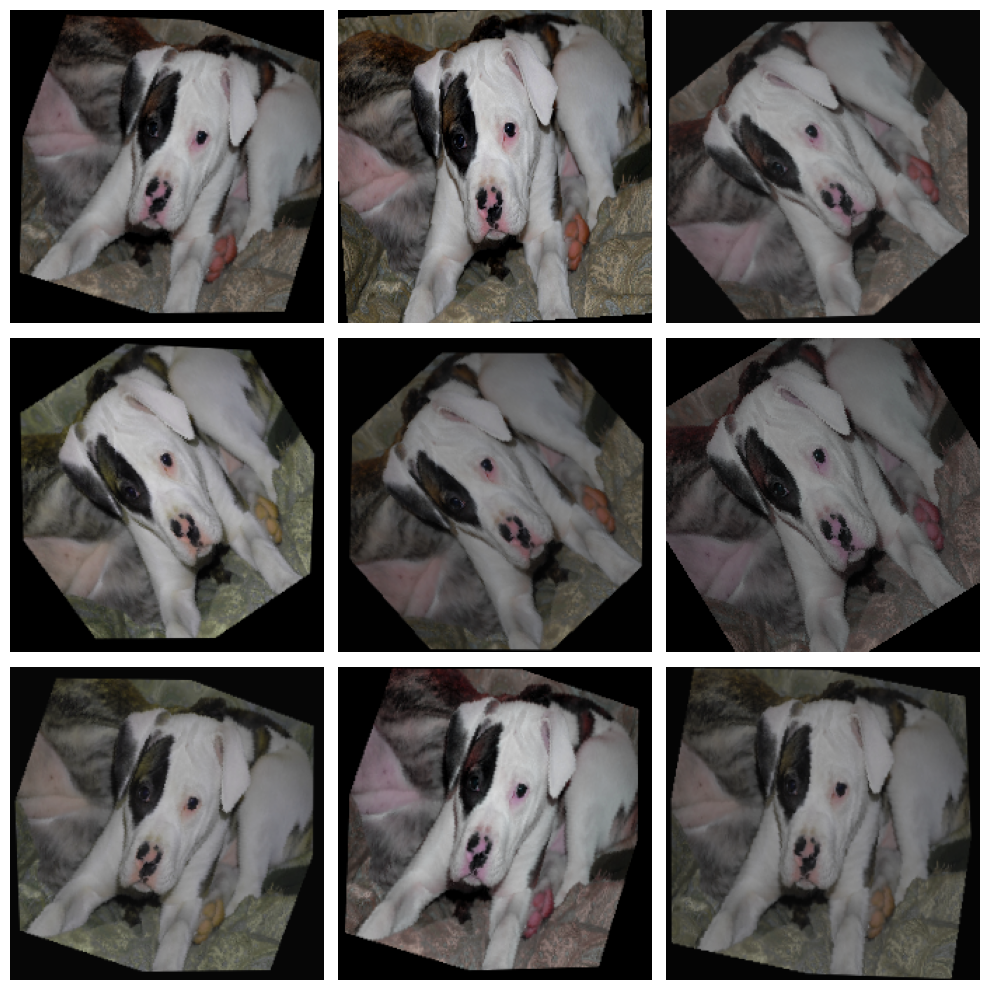

In [14]:
fig = plt.figure()
for i in range(9):
    ax = fig.add_subplot(3, 3, 1+i)
    ax.imshow(ttfms(img))
    remove_ticks(ax)
fig.tight_layout()

# Exercise 13.2

Please explore the full list of transforms in the [`torchvision` documentation](https://pytorch.org/vision/stable/transforms.html#).
Try adding or replacing at least 3 transforms in the `tfms` object and re-run the code to familiarize yourself with what they do.

<!-- startquestion -->

In [15]:
# No code required here.
# Please modify the code above.

Image augmentation with fastai

In previous lessons, we used albumentations and torchvision.transforms to perform image augmentation. If you're using fastai, it comes with its own image augmentation function that allows you to create a whole image augmentation pipeline with one function call. The aug_transforms function returns a composed list of transforms based on the parameters you define. Let's take a look at the defaults for aug_transforms.

In [16]:
help(aug_transforms)

Help on function aug_transforms in module fastai.vision.augment:

aug_transforms(mult: 'float' = 1.0, do_flip: 'bool' = True, flip_vert: 'bool' = False, max_rotate: 'float' = 10.0, min_zoom: 'float' = 1.0, max_zoom: 'float' = 1.1, max_lighting: 'float' = 0.2, max_warp: 'float' = 0.2, p_affine: 'float' = 0.75, p_lighting: 'float' = 0.75, xtra_tfms: 'list' = None, size: 'int | tuple' = None, mode: 'str' = 'bilinear', pad_mode='reflection', align_corners=True, batch=False, min_scale=1.0)
    Utility func to easily create a list of flip, rotate, zoom, warp, lighting transforms.



When you've decided on the transforms you want to use, you can pass aug_transforms to right into your DataLoaders object via the batch_tfms argument, as shown below. In this case, we've adjusted the defaults so the transforms are more pronounced when we call dls.show_batch.

In [17]:
dls = ImageDataLoaders.from_name_func(
    path,
    files,
    label_func=label_func,
    item_tfms=Resize(224),
    batch_tfms=aug_transforms(size=224, max_lighting=0.8, max_warp=0.5, max_zoom=2.)
)

Let's take a look at a few images after transforms are applied. We can see that some of them are clearly distorted, maybe even too much so!

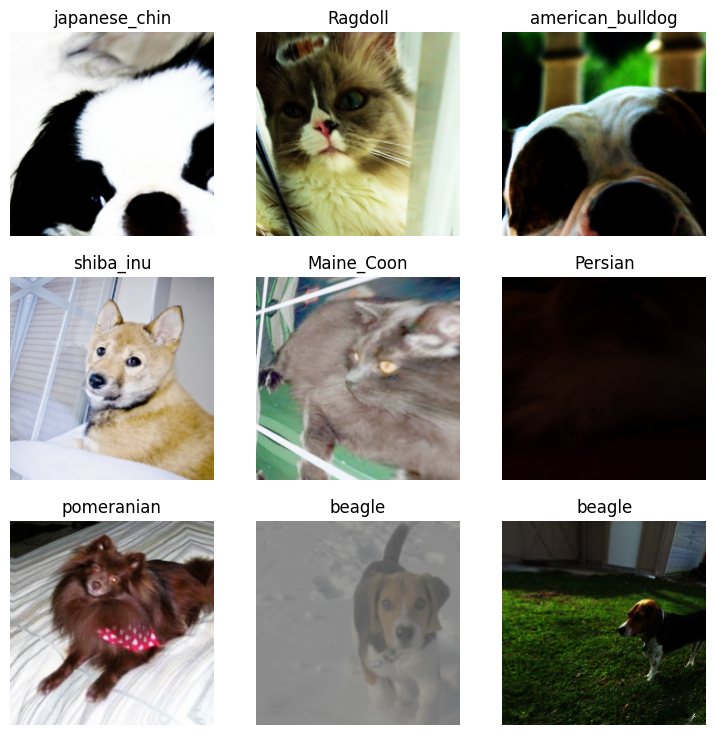

In [18]:
dls.show_batch()

Experiment: Does image augmentation really help?

So far, we've reviewed different types of image augmentation including altering the rotation, color balance, and scale. Do these really help models learn better? Let's conduct a quick experiment to see whether image augmentation helps improve our performance on the pet classification task.

We'll do this by training two models - one without image augmentation for our baseline performance, and one using FastAI's aug_transforms. If there is no improvement in performance, we should expect to see about the same validation loss. Alternately, if the transforms do improve performance, we should see an improvement in the validation loss of our test case.

First, let's set up our experiment. We'll track this experiment using tensorboard. The code block below sets up a log directory, and defines a function that creates a learner based on a DataLoaders object, and names the tensorboard logs based on a exp_name parameter.

In [19]:
!rm -r runs
BASE_LOGDIR = Path('./runs')
if not BASE_LOGDIR.exists():
    BASE_LOGDIR.mkdir()

def build_learner(dls, exp_name:str):
    logdir = BASE_LOGDIR/exp_name
    cbs = [TensorBoardCallback(log_dir=logdir)]
    return vision_learner(dls, resnet18, metrics=[accuracy, error_rate], cbs=cbs)

rm: cannot remove 'runs': No such file or directory


Let's start tensorboard so we can view progress as we train. We've also included a snapshot of what you may expect to see once you re-run the code, since tensorboard will only load when you run the code. In the image below, the blue line represents a classifier trained with aug_transforms, and the orange line represents a classifier trained without aug_transforms.

In [27]:
%load_ext tensorboard
%tensorboard --logdir ./runs

Output hidden; open in https://colab.research.google.com to view.

Now let's collect our baseline. What's the best loss we can achieve without any image augmentation? How overfit is the model on the training data?

In the next few blocks of cells, we instantiate our dataloaders, create our learn object, and train it for 10 epochs.

In [21]:
dls = ImageDataLoaders.from_name_func(
    path,
    files,
    label_func=label_func,
    item_tfms=Resize(224),
    batch_tfms=Normalize.from_stats(*imagenet_stats)
)

In [22]:
learn = build_learner(dls, 'no_tfms')

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 159MB/s]


In [23]:
learn.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.580534,0.353562,0.880920,0.119080,00:41


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.500760,0.287929,0.901894,0.098106,00:46
1,0.381655,0.297614,0.902571,0.097429,00:45
2,0.258367,0.314010,0.894452,0.105548,00:46
3,0.182191,0.331108,0.896482,0.103518,00:44
4,0.128846,0.269100,0.919486,0.080514,00:43
5,0.085134,0.277134,0.918133,0.081867,00:43
6,0.046371,0.279661,0.922192,0.077808,00:44
7,0.031610,0.269232,0.924222,0.075778,00:47
8,0.025647,0.265825,0.926928,0.073072,00:44
9,0.020365,0.267162,0.926252,0.073748,00:43


Now, let's repeat the same process, except we'll use aug_transforms's default transforms.

In [24]:
dls = ImageDataLoaders.from_name_func(
    path,
    files,
    label_func=label_func,
    item_tfms=Resize(224),
    batch_tfms=aug_transforms(size=224)
)

In [25]:
learn = build_learner(dls, 'with_tfms')

In [26]:
learn.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.569791,0.430211,0.868065,0.131935,00:42


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.523425,0.312616,0.905954,0.094046,00:44
1,0.423118,0.299834,0.907984,0.092016,00:45
2,0.362594,0.314786,0.905277,0.094723,00:45
3,0.285654,0.316117,0.904601,0.095399,00:45
4,0.217420,0.300231,0.906631,0.093369,00:46
5,0.168803,0.272269,0.915426,0.084574,00:44
6,0.130642,0.276866,0.916779,0.083221,00:45
7,0.090585,0.266002,0.918133,0.081867,00:46
8,0.076773,0.257428,0.922192,0.077808,00:44
9,0.059196,0.262133,0.922192,0.077808,00:45


What did we observe in this experiment? First, we saw that the training loss without augmentation was lower. This makes sense, because the task is easier - there's only one version of each image to learn.

We also saw that the best validation loss was lower with the transforms, indicating that image augmentation can help generalize better to out-of-distribution (different from the training set) data.

These results are corroborated by work on AutoAugment [3], which found that tuning augmentation approaches helped many computer vision models improve performance on multiple tasks.

In summary, we learned that image augmentation helps improve performance by reducing overfitting.